In [2]:
!pip install kaggle

In [2]:
import warnings
warnings.filterwarnings('ignore')
import os
import pandas as pd
import numpy as np
import math
import datetime as dt
import matplotlib.pyplot as plt

from sklearn.metrics import mean_squared_error, mean_absolute_error, explained_variance_score, r2_score 
from sklearn.metrics import mean_poisson_deviance, mean_gamma_deviance, accuracy_score
from sklearn.preprocessing import MinMaxScaler

from itertools import product
import statsmodels.api as sm

import tensorflow as tf

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Dropout
from tensorflow.keras.layers import LSTM

from itertools import cycle
import plotly.offline as py
import plotly.graph_objects as go
import plotly.express as px
from plotly.subplots import make_subplots

plt.style.use('seaborn-darkgrid')

In [3]:
suppliment_clinical = pd.read_csv("./supplemental_clinical_data.csv")
clinical = pd.read_csv("./train_clinical_data.csv")
peptides = pd.read_csv("./train_peptides.csv")
proteins = pd.read_csv("./train_proteins.csv")

In [4]:
clinical.head()

,visit_id,patient_id,visit_month,updrs_1,updrs_2,updrs_3,updrs_4,upd23b_clinical_state_on_medication
0,55_0,55,0,10.0,6.0,15.0,NaN,NaN
1,55_3,55,3,10.0,7.0,25.0,NaN,NaN
2,55_6,55,6,8.0,10.0,34.0,NaN,NaN
3,55_9,55,9,8.0,9.0,30.0,0.0,On
4,55_12,55,12,10.0,10.0,41.0,0.0,On


In [5]:
clinical.isnull().sum()

visit_id                                  0
patient_id                                0
visit_month                               0
updrs_1                                   1
updrs_2                                   2
updrs_3                                  25
updrs_4                                1038
upd23b_clinical_state_on_medication    1327
dtype: int64

In [6]:
clinical['updrs_1'].fillna((clinical['updrs_1'].mean()), inplace=True)
clinical['updrs_2'].fillna((clinical['updrs_2'].mean()), inplace=True)
clinical['updrs_3'].fillna((clinical['updrs_3'].mean()), inplace=True)

In [7]:
clinical['updrs_4'].fillna(0, inplace=True)

In [8]:
clinical.isnull().sum()

visit_id                                  0
patient_id                                0
visit_month                               0
updrs_1                                   0
updrs_2                                   0
updrs_3                                   0
updrs_4                                   0
upd23b_clinical_state_on_medication    1327
dtype: int64

In [69]:
clinical["visit_month"] = clinical["visit_month"].astype("int64")

In [70]:
print(len(clinical))

2615


In [71]:
suppliment_clinical.head(2)

,visit_id,patient_id,visit_month,updrs_1,updrs_2,updrs_3,updrs_4,upd23b_clinical_state_on_medication
0,35_0,35,0,5.0,3.0,16.0,0.0,NaN
1,35_36,35,36,6.0,4.0,20.0,0.0,NaN


In [72]:
peptides.head(2)

,visit_id,visit_month,patient_id,UniProt,Peptide,PeptideAbundance
0,55_0,0,55,O00391,NEQEQPLGQWHLS,11254.3
1,55_0,0,55,O00533,GNPEPTFSWTK,102060.0


Assuming missing MDS-UPDRS4 score values to be 0 which would indicate no motor calculation. Although this is counter-intuitive for those cases when score was non-zero initially (ex: month 0 or month 6 etc) but then became 0. But untill a better assumption can be made we continue with this one.
2 possible alternatives:
a) Introduce values with a simple model like a linear regressor.
b) Use Insights from Peptide/Protein data of Patients if possible.

In [73]:
suppliment_clinical.isnull().sum()

visit_id                                  0
patient_id                                0
visit_month                               0
updrs_1                                 213
updrs_2                                 214
updrs_3                                   5
updrs_4                                 928
upd23b_clinical_state_on_medication    1101
dtype: int64

In [74]:
print(len(suppliment_clinical))

2223


In [75]:
print(suppliment_clinical['patient_id'].nunique())

771


In [76]:
print(clinical['patient_id'].nunique())

248


In [77]:
clinical_copy = clinical.copy()
suppliment_clinical_copy = suppliment_clinical.copy()

In [78]:
common_entries = clinical[clinical_data['patient_id'].isin(suppliment_clinical['patient_id'])]

In [79]:
common_entries

,visit_id,patient_id,visit_month,updrs_1,updrs_2,updrs_3,updrs_4,upd23b_clinical_state_on_medication


No common entries in the 2 datasets and have roughly a 3:1 split, so can be used as training and test datasets
Now removing na values from suppliment_clinical data and the we will use it as training set.

In [80]:
suppliment_clinical['updrs_1'].fillna((suppliment_clinical['updrs_1'].mean()), inplace=True)
suppliment_clinical['updrs_2'].fillna((suppliment_clinical['updrs_2'].mean()), inplace=True)
suppliment_clinical['updrs_3'].fillna((suppliment_clinical['updrs_3'].mean()), inplace=True)
suppliment_clinical['updrs_4'].fillna(0, inplace=True)
suppliment_clinical.isnull().sum()

visit_id                                  0
patient_id                                0
visit_month                               0
updrs_1                                   0
updrs_2                                   0
updrs_3                                   0
updrs_4                                   0
upd23b_clinical_state_on_medication    1101
dtype: int64

In [81]:
suppliment_clinical['updrs_4'].isnull().sum()

0

In [82]:
sc_copy = suppliment_clinical.copy()

In [83]:
cc_copy = clinical.copy()

In [92]:
grouped_data = sc_copy.groupby('patient_id')

# Create a dictionary to store the clusters
clusters = {}

# Iterate over each group
for patient_id, group in grouped_data:
    clusters[patient_id] = group

In [93]:
clusters

{35:   visit_id  patient_id  visit_month  updrs_1  updrs_2  updrs_3  updrs_4  \
 0     35_0          35            0      5.0      3.0     16.0      0.0   
 1    35_36          35           36      6.0      4.0     20.0      0.0   
 
   upd23b_clinical_state_on_medication  
 0                                 NaN  
 1                                 NaN  ,
 75:   visit_id  patient_id  visit_month  updrs_1  updrs_2  updrs_3  updrs_4  \
 2     75_0          75            0      4.0      6.0     26.0      0.0   
 3    75_36          75           36      1.0      8.0     38.0      0.0   
 
   upd23b_clinical_state_on_medication  
 2                                 NaN  
 3                                  On  ,
 155:   visit_id  patient_id  visit_month  updrs_1   updrs_2  updrs_3  updrs_4  \
 4    155_0         155            0  5.68408  6.507715      0.0      0.0   
 
   upd23b_clinical_state_on_medication  
 4                                 NaN  ,
 337:   visit_id  patient_id  visit_mont

In [108]:
# Count the number of clusters with total rows < 7
numclusters = 0

for patient_id, group in grouped_data:
    if len(group) > 3:
        numclusters += 1

print(numclusters)
print(len(clusters))

237
771


In [94]:
c_grouped_data = cc_copy.groupby('patient_id')

# Create a dictionary to store the clusters
c_clusters = {}

# Iterate over each group
for patient_id, group in c_grouped_data:
    c_clusters[patient_id] = group
    
c_clusters

{55:    visit_id  patient_id visit_month  updrs_1  updrs_2  updrs_3  updrs_4  \
 0      55_0          55           0     10.0      6.0     15.0      0.0   
 1      55_3          55           3     10.0      7.0     25.0      0.0   
 2      55_6          55           6      8.0     10.0     34.0      0.0   
 3      55_9          55           9      8.0      9.0     30.0      0.0   
 4     55_12          55          12     10.0     10.0     41.0      0.0   
 5     55_18          55          18      7.0     13.0     38.0      0.0   
 6     55_24          55          24     16.0      9.0     49.0      0.0   
 7     55_30          55          30     14.0     13.0     49.0      0.0   
 8     55_36          55          36     17.0     18.0     51.0      0.0   
 9     55_42          55          42     12.0     20.0     41.0      0.0   
 10    55_48          55          48     17.0     16.0     52.0      0.0   
 11    55_54          55          54     12.0     18.0     51.0      0.0   
 12    5

In [104]:
# Count the number of clusters with total rows < 7
num_clusters = 0

for patient_id, group in c_grouped_data:
    if len(group) >= 3:
        num_clusters += 1

print(num_clusters)
print(len(c_clusters))

248
248


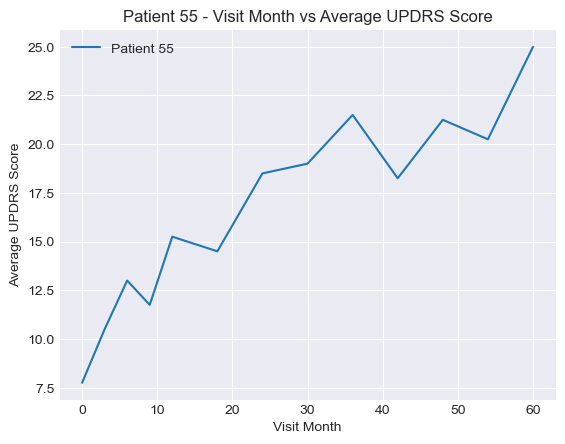

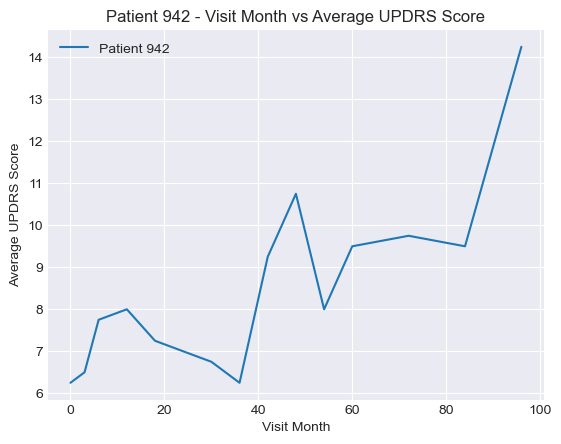

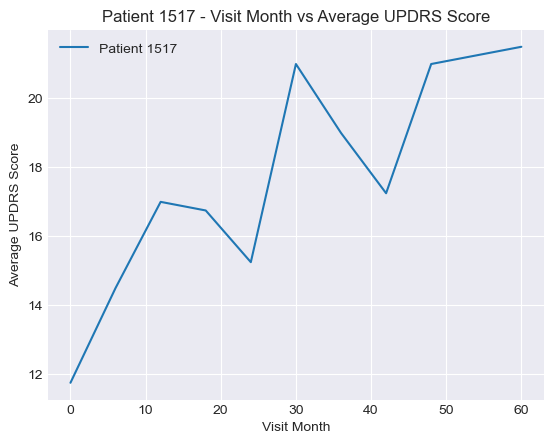

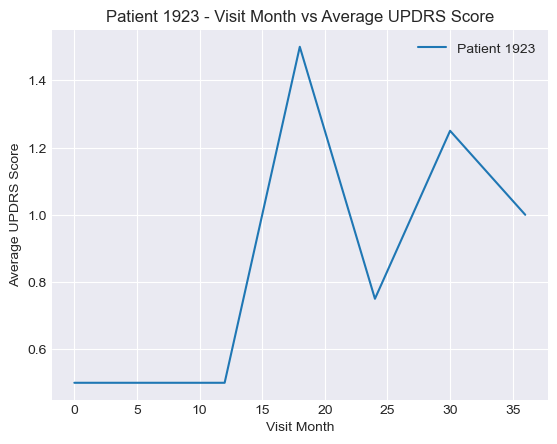

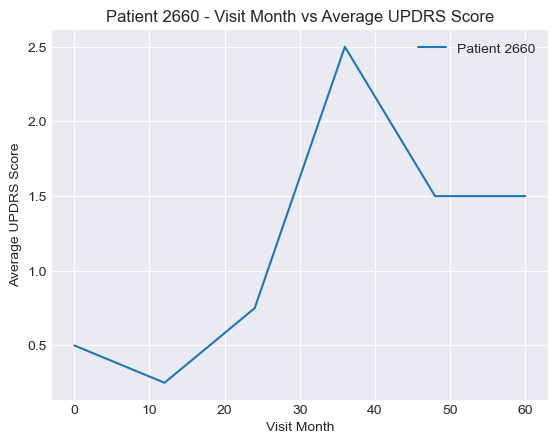

...

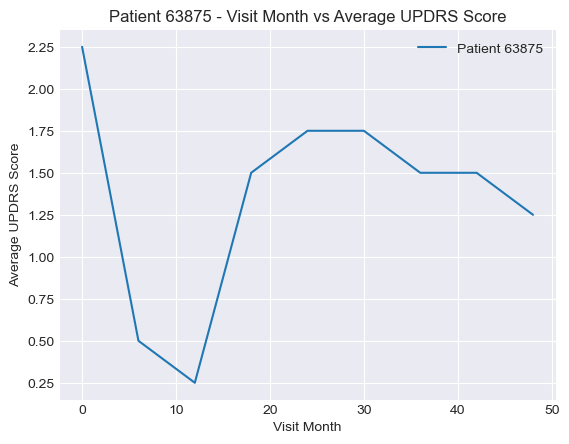

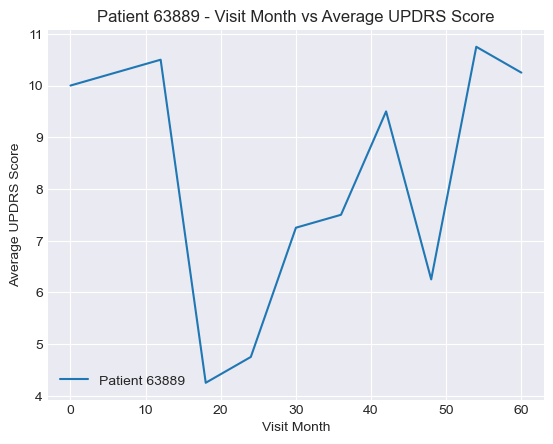

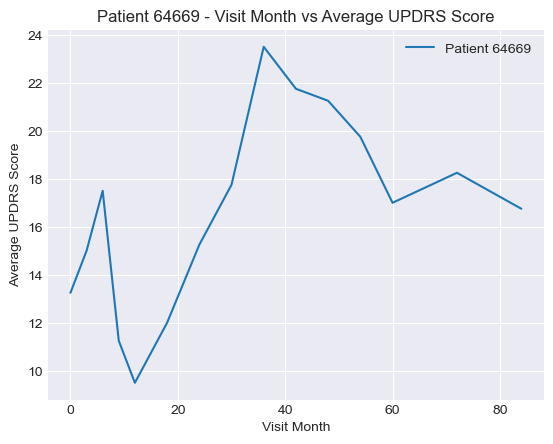

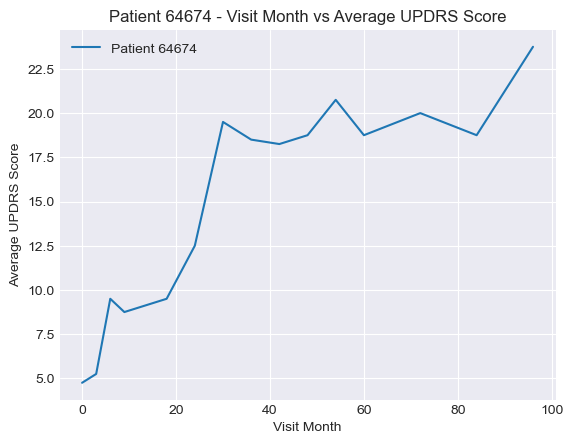

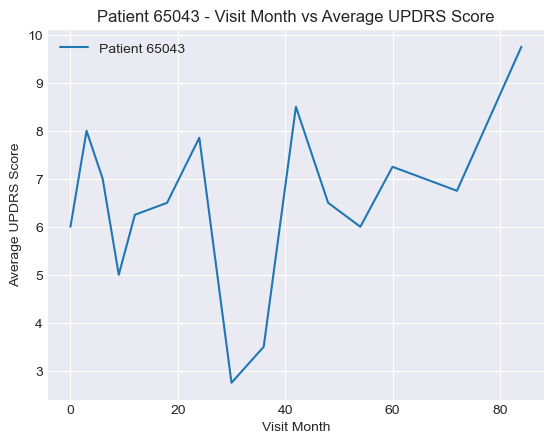

In [99]:
import pandas as pd
import matplotlib.pyplot as plt

total_graphs = 0

# Iterate over each cluster
for patient_id, cluster_data in c_clusters.items():
    # Extract the visit month from the "visit_id" column
    cluster_data['visit_month'] = cluster_data['visit_id'].apply(lambda x: int(x.split('_')[1]))
    
    # Calculate the average UPDRS score
    cluster_data['Average_UPDRS'] = cluster_data[['updrs_1', 'updrs_2', 'updrs_3', 'updrs_4']].mean(axis=1)
    
    # Plot visit month vs average UPDRS score
    plt.plot(cluster_data['visit_month'], cluster_data['Average_UPDRS'], label=f'Patient {patient_id}')
    plt.xlabel('Visit Month')
    plt.ylabel('Average UPDRS Score')
    plt.title(f'Patient {patient_id} - Visit Month vs Average UPDRS Score')
    plt.legend()
    plt.show()
    
    total_graphs+=1


Now since 246 of 248 clusters have a minimum of 4 rows, dropping clusters with fewer rows.

In [105]:
# Find the clusters with fewer than 4 rows
clusters_to_drop = [cluster_id for cluster_id, cluster_data in c_clusters.items() if len(cluster_data) < 4]

# Drop the clusters from the dictionary
for cluster_id in clusters_to_drop:
    c_clusters.pop(cluster_id)

print("Dropped clusters:", clusters_to_drop)

Dropped clusters: [14450, 60443]


In [106]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# Assuming you have the dictionary of clusters named "c_clusters"

# Iterate over each cluster
for cluster_id, cluster_data in c_clusters.items():
    # Check if the cluster has more than 4 rows
    if len(cluster_data) > 4:
        # Create input sequences and target values
        inputs = []
        targets = []

        # Generate input sequences and target values
        for i in range(0, len(cluster_data) - 3):
            input_seq = cluster_data['Average_UPDRS'].iloc[i:i+3].values
            target_val = cluster_data['Average_UPDRS'].iloc[i+3]
            inputs.append(input_seq)
            targets.append(target_val)

        # Convert input sequences and target values to numpy arrays
        inputs = np.array(inputs)
        targets = np.array(targets)

        # Reshape inputs to match the LSTM input shape (samples, timesteps, features)
        inputs = np.reshape(inputs, (inputs.shape[0], 3, 1))

        # Create an LSTM model
        model = Sequential()
        model.add(LSTM(32, input_shape=(3, 1)))
        model.add(Dense(1))
        model.compile(loss='mean_squared_error', optimizer='adam')

        # Train the model
        model.fit(inputs, targets, epochs=10, batch_size=1)

        # Save the trained model if needed
        # model.save(f"lstm_model_{cluster_id}.h5")


Epoch 1/10
10/10 [==============================] - 3s 5ms/step - loss: 355.3295
Epoch 2/10
10/10 [==============================] - 0s 5ms/step - loss: 337.8859
Epoch 3/10
10/10 [==============================] - 0s 4ms/step - loss: 318.5257
Epoch 4/10
10/10 [==============================] - 0s 5ms/step - loss: 300.4306
Epoch 5/10
10/10 [==============================] - 0s 4ms/step - loss: 282.8521
Epoch 6/10
10/10 [==============================] - 0s 4ms/step - loss: 265.1485
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 247.0734
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 226.1517
Epoch 9/10
10/10 [==============================] - 0s 5ms/step - loss: 206.8444
Epoch 10/10
10/10 [==============================] - 0s 3ms/step - loss: 190.6198
Epoch 1/10
12/12 [==============================] - 3s 3ms/step - loss: 62.4586
Epoch 2/10
12/12 [==============================] - 0s 4ms/step - loss: 52.5435
Epoch 3/10
12/12 [===========

4/4 [==============================] - 0s 5ms/step - loss: 0.0642
Epoch 10/10
4/4 [==============================] - 0s 2ms/step - loss: 0.0579
Epoch 1/10
6/6 [==============================] - 2s 4ms/step - loss: 602.3240
Epoch 2/10
6/6 [==============================] - 0s 3ms/step - loss: 583.0709
Epoch 3/10
6/6 [==============================] - 0s 3ms/step - loss: 566.8943
Epoch 4/10
6/6 [==============================] - 0s 3ms/step - loss: 552.4368
Epoch 5/10
6/6 [==============================] - 0s 3ms/step - loss: 539.2704
Epoch 6/10
6/6 [==============================] - 0s 3ms/step - loss: 525.8936
Epoch 7/10
6/6 [==============================] - 0s 3ms/step - loss: 512.4182
Epoch 8/10
6/6 [==============================] - 0s 4ms/step - loss: 498.5738
Epoch 9/10
6/6 [==============================] - 0s 4ms/step - loss: 484.6692
Epoch 10/10
6/6 [==============================] - 0s 5ms/step - loss: 470.2942
Epoch 1/10
8/8 [==============================] - 2s 5ms/step - l

12/12 [==============================] - 0s 3ms/step - loss: 16.1342
Epoch 8/10
12/12 [==============================] - 0s 4ms/step - loss: 12.3685
Epoch 9/10
12/12 [==============================] - 0s 3ms/step - loss: 9.7560
Epoch 10/10
12/12 [==============================] - 0s 4ms/step - loss: 7.6206
Epoch 1/10
10/10 [==============================] - 2s 4ms/step - loss: 13.5663
Epoch 2/10
10/10 [==============================] - 0s 3ms/step - loss: 10.8973
Epoch 3/10
10/10 [==============================] - 0s 3ms/step - loss: 8.4482
Epoch 4/10
10/10 [==============================] - 0s 4ms/step - loss: 6.3399
Epoch 5/10
10/10 [==============================] - 0s 2ms/step - loss: 4.4087
Epoch 6/10
10/10 [==============================] - 0s 3ms/step - loss: 2.8065
Epoch 7/10
10/10 [==============================] - 0s 4ms/step - loss: 1.6123
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 0.9447
Epoch 9/10
10/10 [==============================] - 0s 3ms

13/13 [==============================] - 0s 3ms/step - loss: 112.3391
Epoch 5/10
13/13 [==============================] - 0s 3ms/step - loss: 97.9591
Epoch 6/10
13/13 [==============================] - 0s 3ms/step - loss: 82.9851
Epoch 7/10
13/13 [==============================] - 0s 4ms/step - loss: 68.5888
Epoch 8/10
13/13 [==============================] - 0s 4ms/step - loss: 57.2153
Epoch 9/10
13/13 [==============================] - 0s 3ms/step - loss: 47.3344
Epoch 10/10
13/13 [==============================] - 0s 3ms/step - loss: 39.8465
Epoch 1/10
11/11 [==============================] - 2s 4ms/step - loss: 129.0565
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 117.5830
Epoch 3/10
11/11 [==============================] - 0s 4ms/step - loss: 106.1801
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 95.0736
Epoch 5/10
11/11 [==============================] - 0s 4ms/step - loss: 83.5599
Epoch 6/10
11/11 [============================

13/13 [==============================] - 2s 4ms/step - loss: 116.6744
Epoch 2/10
13/13 [==============================] - 0s 3ms/step - loss: 104.1506
Epoch 3/10
13/13 [==============================] - 0s 3ms/step - loss: 93.6099
Epoch 4/10
13/13 [==============================] - 0s 4ms/step - loss: 83.1247
Epoch 5/10
13/13 [==============================] - 0s 3ms/step - loss: 72.5964
Epoch 6/10
13/13 [==============================] - 0s 3ms/step - loss: 62.3205
Epoch 7/10
13/13 [==============================] - 0s 3ms/step - loss: 52.6132
Epoch 8/10
13/13 [==============================] - 0s 3ms/step - loss: 44.2353
Epoch 9/10
13/13 [==============================] - 0s 3ms/step - loss: 37.0674
Epoch 10/10
13/13 [==============================] - 0s 3ms/step - loss: 31.1146
Epoch 1/10
11/11 [==============================] - 2s 4ms/step - loss: 79.7205
Epoch 2/10
11/11 [==============================] - 0s 4ms/step - loss: 71.8474
Epoch 3/10
11/11 [==============================

5/5 [==============================] - 0s 4ms/step - loss: 0.4151
Epoch 1/10
13/13 [==============================] - 2s 5ms/step - loss: 55.0014
Epoch 2/10
13/13 [==============================] - 0s 3ms/step - loss: 48.8511
Epoch 3/10
13/13 [==============================] - 0s 3ms/step - loss: 42.4606
Epoch 4/10
13/13 [==============================] - 0s 3ms/step - loss: 36.1887
Epoch 5/10
13/13 [==============================] - 0s 3ms/step - loss: 29.3468
Epoch 6/10
13/13 [==============================] - 0s 3ms/step - loss: 22.8644
Epoch 7/10
13/13 [==============================] - 0s 3ms/step - loss: 16.6426
Epoch 8/10
13/13 [==============================] - 0s 3ms/step - loss: 11.7675
Epoch 9/10
13/13 [==============================] - 0s 4ms/step - loss: 8.2402
Epoch 10/10
13/13 [==============================] - 0s 3ms/step - loss: 5.9845
Epoch 1/10
12/12 [==============================] - 2s 5ms/step - loss: 52.6051
Epoch 2/10
12/12 [==============================] - 0s 

4/4 [==============================] - 0s 4ms/step - loss: 8.9359
Epoch 8/10
4/4 [==============================] - 0s 4ms/step - loss: 7.7755
Epoch 9/10
4/4 [==============================] - 0s 6ms/step - loss: 6.7848
Epoch 10/10
4/4 [==============================] - 0s 3ms/step - loss: 5.8128
Epoch 1/10
5/5 [==============================] - 2s 5ms/step - loss: 3.3049
Epoch 2/10
5/5 [==============================] - 0s 4ms/step - loss: 3.0415
Epoch 3/10
5/5 [==============================] - 0s 4ms/step - loss: 2.7843
Epoch 4/10
5/5 [==============================] - 0s 4ms/step - loss: 2.5731
Epoch 5/10
5/5 [==============================] - 0s 5ms/step - loss: 2.3281
Epoch 6/10
5/5 [==============================] - 0s 3ms/step - loss: 2.0937
Epoch 7/10
5/5 [==============================] - 0s 3ms/step - loss: 1.8861
Epoch 8/10
5/5 [==============================] - 0s 2ms/step - loss: 1.6610
Epoch 9/10
5/5 [==============================] - 0s 4ms/step - loss: 1.4415
Epoch 10/

3/3 [==============================] - 0s 4ms/step - loss: 11.0951
Epoch 5/10
3/3 [==============================] - 0s 2ms/step - loss: 10.9427
Epoch 6/10
3/3 [==============================] - 0s 5ms/step - loss: 10.7879
Epoch 7/10
3/3 [==============================] - 0s 8ms/step - loss: 10.6614
Epoch 8/10
3/3 [==============================] - 0s 9ms/step - loss: 10.5013
Epoch 9/10
3/3 [==============================] - 0s 1ms/step - loss: 10.3382
Epoch 10/10
3/3 [==============================] - 0s 8ms/step - loss: 10.1747
Epoch 1/10
4/4 [==============================] - 3s 6ms/step - loss: 100.7624
Epoch 2/10
4/4 [==============================] - 0s 5ms/step - loss: 97.4700
Epoch 3/10
4/4 [==============================] - 0s 11ms/step - loss: 94.3031
Epoch 4/10
4/4 [==============================] - 0s 5ms/step - loss: 91.1465
Epoch 5/10
4/4 [==============================] - 0s 170us/step - loss: 87.9262
Epoch 6/10
4/4 [==============================] - 0s 7ms/step - loss: 

6/6 [==============================] - 0s 6ms/step - loss: 7.8634
Epoch 1/10
4/4 [==============================] - 2s 8ms/step - loss: 0.7082
Epoch 2/10
4/4 [==============================] - 0s 2ms/step - loss: 0.6120
Epoch 3/10
4/4 [==============================] - 0s 3ms/step - loss: 0.5331
Epoch 4/10
4/4 [==============================] - 0s 3ms/step - loss: 0.4734
Epoch 5/10
4/4 [==============================] - 0s 1ms/step - loss: 0.4048
Epoch 6/10
4/4 [==============================] - 0s 1ms/step - loss: 0.3420
Epoch 7/10
4/4 [==============================] - 0s 4ms/step - loss: 0.2941
Epoch 8/10
4/4 [==============================] - 0s 3ms/step - loss: 0.2444
Epoch 9/10
4/4 [==============================] - 0s 2ms/step - loss: 0.2259
Epoch 10/10
4/4 [==============================] - 0s 3ms/step - loss: 0.2014
Epoch 1/10
7/7 [==============================] - 3s 3ms/step - loss: 0.9112
Epoch 2/10
7/7 [==============================] - 0s 3ms/step - loss: 0.8727
Epoch 3/1

11/11 [==============================] - 0s 4ms/step - loss: 4.7472
Epoch 9/10
11/11 [==============================] - 0s 4ms/step - loss: 3.6138
Epoch 10/10
11/11 [==============================] - 0s 3ms/step - loss: 2.8592
Epoch 1/10
11/11 [==============================] - 2s 4ms/step - loss: 70.4891
Epoch 2/10
11/11 [==============================] - 0s 3ms/step - loss: 63.6994
Epoch 3/10
11/11 [==============================] - 0s 3ms/step - loss: 56.1551
Epoch 4/10
11/11 [==============================] - 0s 3ms/step - loss: 48.0719
Epoch 5/10
11/11 [==============================] - 0s 3ms/step - loss: 40.2527
Epoch 6/10
11/11 [==============================] - 0s 3ms/step - loss: 31.9253
Epoch 7/10
11/11 [==============================] - 0s 3ms/step - loss: 25.3411
Epoch 8/10
11/11 [==============================] - 0s 4ms/step - loss: 19.6839
Epoch 9/10
11/11 [==============================] - 0s 3ms/step - loss: 15.5105
Epoch 10/10
11/11 [==============================] - 

10/10 [==============================] - 0s 3ms/step - loss: 28.3268
Epoch 6/10
10/10 [==============================] - 0s 3ms/step - loss: 22.8063
Epoch 7/10
10/10 [==============================] - 0s 3ms/step - loss: 18.4134
Epoch 8/10
10/10 [==============================] - 0s 4ms/step - loss: 14.6444
Epoch 9/10
10/10 [==============================] - 0s 3ms/step - loss: 11.3947
Epoch 10/10
10/10 [==============================] - 0s 3ms/step - loss: 9.0247
Epoch 1/10
11/11 [==============================] - 2s 3ms/step - loss: 60.6593
Epoch 2/10
11/11 [==============================] - 0s 3ms/step - loss: 53.9742
Epoch 3/10
11/11 [==============================] - 0s 3ms/step - loss: 46.8122
Epoch 4/10
11/11 [==============================] - 0s 4ms/step - loss: 39.6720
Epoch 5/10
11/11 [==============================] - 0s 3ms/step - loss: 32.3947
Epoch 6/10
11/11 [==============================] - 0s 3ms/step - loss: 24.4827
Epoch 7/10
11/11 [==============================] -

11/11 [==============================] - 0s 3ms/step - loss: 265.6695
Epoch 3/10
11/11 [==============================] - 0s 2ms/step - loss: 246.3707
Epoch 4/10
11/11 [==============================] - 0s 3ms/step - loss: 226.1042
Epoch 5/10
11/11 [==============================] - 0s 2ms/step - loss: 205.9297
Epoch 6/10
11/11 [==============================] - 0s 4ms/step - loss: 186.1305
Epoch 7/10
11/11 [==============================] - 0s 3ms/step - loss: 166.7107
Epoch 8/10
11/11 [==============================] - 0s 3ms/step - loss: 148.0322
Epoch 9/10
11/11 [==============================] - 0s 3ms/step - loss: 130.8239
Epoch 10/10
11/11 [==============================] - 0s 3ms/step - loss: 117.1827
Epoch 1/10
9/9 [==============================] - 2s 4ms/step - loss: 169.3807
Epoch 2/10
9/9 [==============================] - 0s 3ms/step - loss: 159.9570
Epoch 3/10
9/9 [==============================] - 0s 2ms/step - loss: 149.8831
Epoch 4/10
9/9 [============================

In [110]:
# Assuming you have a dictionary of clusters named "clusters" containing the supplement_clinical_data

# Drop clusters with <=3 rows
clusters_to_drop = [cluster_id for cluster_id, cluster_data in clusters.items() if len(cluster_data) <= 3]
for cluster_id in clusters_to_drop:
    clusters.pop(cluster_id)

print("Dropped clusters:", clusters_to_drop)

# Create the test/validation dataset
test_data = clusters

# Iterate over each cluster in the test/validation dataset
for cluster_id, cluster_data in test_data.items():
    # Calculate the average UPDRS score for each row in the cluster
    cluster_data['Average_UPDRS'] = cluster_data[['updrs_1', 'updrs_2', 'updrs_3', 'updrs_4']].mean(axis=1)

    # Prepare the test inputs and targets
    test_inputs = []
    test_targets = []

    # Generate input sequences and target values
    for i in range(0, len(cluster_data) - 3):
        input_seq = cluster_data['Average_UPDRS'].iloc[i:i+3].values
        target_val = cluster_data['Average_UPDRS'].iloc[i+3]
        test_inputs.append(input_seq)
        test_targets.append(target_val)

    # Convert test inputs and targets to numpy arrays
    test_inputs = np.array(test_inputs)
    test_targets = np.array(test_targets)
    test_inputs = np.reshape(test_inputs, (test_inputs.shape[0], 3, 1))

    # Perform evaluation on the cluster
    loss = model.evaluate(test_inputs, test_targets, verbose=0)

    print("Cluster:", cluster_id)
    print("Loss:", loss)
    print("------")


Dropped clusters: []
Cluster: 755
Loss: 0.41333523392677307
------
Cluster: 994
Loss: 2.2865397930145264
------
Cluster: 1141
Loss: 23.64837646484375
------
Cluster: 1222
Loss: 61.800689697265625
------
Cluster: 1362
Loss: 2.564460515975952
------
Cluster: 1680
Loss: 30.57541275024414
------
Cluster: 1788
Loss: 52.28369140625
------
Cluster: 2380
Loss: 31.656408309936523
------
Cluster: 2388
Loss: 0.5306754112243652
------
Cluster: 2520
Loss: 102.3552474975586
------
Cluster: 2656
Loss: 5.525523662567139
------
Cluster: 2677
Loss: 2.2109427452087402
------
Cluster: 2689
Loss: 53.804100036621094
------
Cluster: 2831
Loss: 14.763572692871094
------
Cluster: 3384
Loss: 12.5220947265625
------
Cluster: 3628
Loss: 2.582913637161255
------
Cluster: 3915
Loss: 35.02108383178711
------
Cluster: 4005
Loss: 1.258072853088379
------
Cluster: 4462
Loss: 13.193804740905762
------
Cluster: 4635
Loss: 24.295089721679688
------
Cluster: 4722
Loss: 29.49854278564453
------
Cluster: 5233
Loss: 62.041873

Cluster: 47655
Loss: 37.3455810546875
------
Cluster: 47689
Loss: 4.420119285583496
------
Cluster: 47969
Loss: 67.86744689941406
------
Cluster: 48315
Loss: 14.973002433776855
------
Cluster: 49919
Loss: 5.420267105102539
------
Cluster: 49961
Loss: 14.629258155822754
------
Cluster: 50512
Loss: 9.950655937194824
------
Cluster: 50713
Loss: 0.5995891690254211
------
Cluster: 50766
Loss: 19.722394943237305
------
Cluster: 51271
Loss: 1.4387481212615967
------
Cluster: 51288
Loss: 48.99037551879883
------
Cluster: 51456
Loss: 54.49201583862305
------
Cluster: 51506
Loss: 331.5982360839844
------
Cluster: 52288
Loss: 19.642976760864258
------
Cluster: 52456
Loss: 5.78941535949707
------
Cluster: 52665
Loss: 1.4028449058532715
------
Cluster: 52833
Loss: 0.473660945892334
------
Cluster: 52988
Loss: 23.249908447265625
------
Cluster: 53200
Loss: 13.91504955291748
------
Cluster: 53455
Loss: 68.96984100341797
------
Cluster: 54660
Loss: 39.364646911621094
------
Cluster: 54754
Loss: 65.526

In [43]:
sc_copy.head(12)

,visit_id,patient_id,visit_month,updrs_1,updrs_2,updrs_3,updrs_4,upd23b_clinical_state_on_medication
0,35_0,35,0,5.00000,3.000000,16.0,0.0,NaN
1,35_36,35,36,6.00000,4.000000,20.0,0.0,NaN
2,75_0,75,0,4.00000,6.000000,26.0,0.0,NaN
3,75_36,75,36,1.00000,8.000000,38.0,0.0,On
4,155_0,155,0,5.68408,6.507715,0.0,0.0,NaN
5,337_0,337,0,5.00000,7.000000,6.0,0.0,On
6,337_36,337,36,8.00000,7.000000,8.0,0.0,On
7,527_0,527,0,6.00000,2.000000,9.0,0.0,NaN
8,527_36,527,36,2.00000,18.000000,22.0,0.0,On
9,557_0,557,0,5.00000,6.000000,22.0,0.0,NaN


In [ ]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense

# Assuming you have the dictionary of clusters named "c_clusters"

# Iterate over each cluster
for cluster_id, cluster_data in c_clusters.items():
    # Check if the cluster has more than 4 rows
    if len(cluster_data) > 4:
        # Create input sequences and target values
        inputs = []
        targets = []

        # Generate input sequences and target values
        for i in range(0, len(cluster_data) - 3):
            input_seq = cluster_data['Average_UPDRS'].iloc[i:i+3].values
            target_val = cluster_data['Average_UPDRS'].iloc[i+3]
            inputs.append(input_seq)
            targets.append(target_val)

        # Convert input sequences and target values to numpy arrays
        inputs = np.array(inputs)
        targets = np.array(targets)

        # Reshape inputs to match the LSTM input shape (samples, timesteps, features)
        inputs = np.reshape(inputs, (inputs.shape[0], 3, 1))

        # Create an LSTM model
        model = Sequential()
        model.add(LSTM(32, input_shape=(3, 1)))
        model.add(Dense(1))
        model.compile(loss='mean_squared_error', optimizer='adam')

        # Train the model
        model.fit(inputs, targets, epochs=10, batch_size=1)

        # Save the trained model if needed
        # model.save(f"lstm_model_{cluster_id}.h5")


In [1]:
from sklearn.metrics import r2_score

# Assuming you have already dropped clusters with <=3 rows and created the test_data dictionary

r_squared_scores = []

# Iterate over each cluster in the test/validation dataset
for cluster_id, cluster_data in test_data.items():
    # Calculate the average UPDRS score for each row in the cluster
    cluster_data['Average_UPDRS'] = cluster_data[['updrs_1', 'updrs_2', 'updrs_3', 'updrs_4']].mean(axis=1)

    # Prepare the test inputs and targets
    test_inputs = []
    test_targets = []

    # Generate input sequences and target values
    for i in range(0, len(cluster_data) - 3):
        input_seq = cluster_data['Average_UPDRS'].iloc[i:i+3].values
        target_val = cluster_data['Average_UPDRS'].iloc[i+3]
        test_inputs.append(input_seq)
        test_targets.append(target_val)

    # Convert test inputs and targets to numpy arrays
    test_inputs = np.array(test_inputs)
    test_targets = np.array(test_targets)
    test_inputs = np.reshape(test_inputs, (test_inputs.shape[0], 3, 1))

    # Perform evaluation on the cluster
    predictions = model.predict(test_inputs)
    r_squared = r2_score(test_targets, predictions)
    r_squared_scores.append(r_squared)

    print("Cluster:", cluster_id)
    print("R-squared:", r_squared)
    print("------")

# Calculate the average R-squared score
average_r_squared = np.mean(r_squared_scores)
print("Average R-squared:", average_r_squared)


NameError: name 'test_data' is not defined